# <center> **MULTI-CLASS IMAGE CLASSIFICATION OF SKIN DISEASES USING CNN**
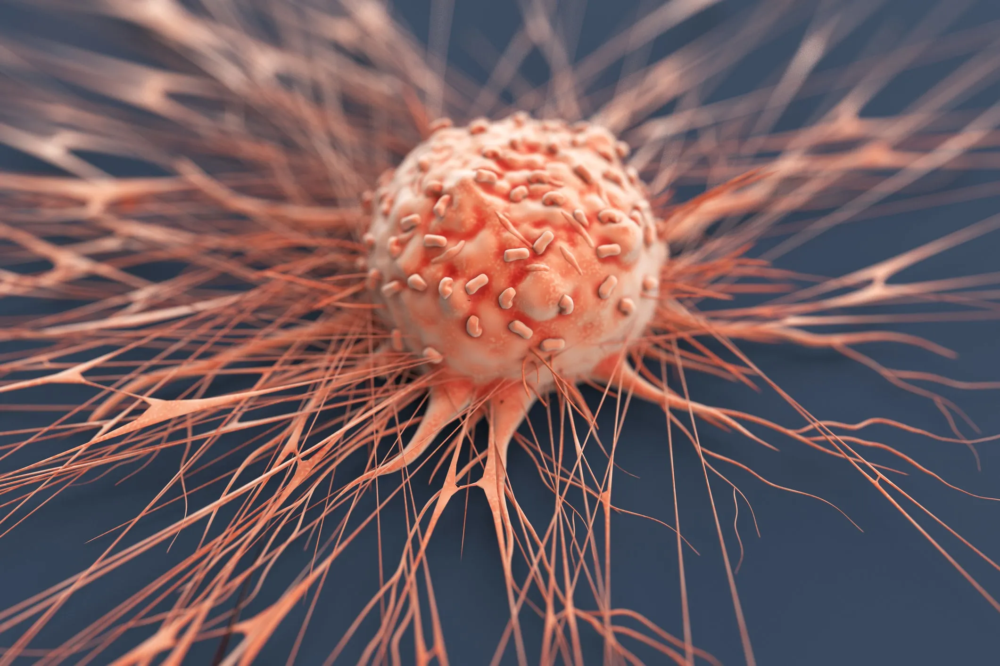

# **1.0 BUSINESS UNDERSTANDING**

Skin diseases present in many different forms impacting individuals'overall health and well-being. Some of these skin diseases can be challenging to categorize and detect, which introduces complexity to the field of dermatology. The importance of accurate diagnosis cannot be overstated, as certain skin disorders, including various types of skin cancer, have the potential to be life-threatening. Early and accurate identification of the types of skin diseases is of great importance. The diagnostic process typically involves a range of methods, including visual image inspections, biopsies, and histopathological analyses. Distinguishing between benign and malignant lesions is particularly important as even minor or inconspicuous abnormalities can be difficult to detect. In response to these diagnostic challenges, cutting-edge technologies like deep learning algorithms offer the potential to revolutionize dermatological diagnostics, enhancing efficiency, reducing errors, and ultimately improving patient outcomes across various skin disordes types.
Read more on below links:

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5817488/

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6403009/


## **1.1 Problem Statement**
Dermatologists at Flatter Dermatological Clinic are facing difficulties in accurately determining or categorizing various skin conditions types when examining medical skin images. Currently, this task heavily relies on manual visual inspection and personal judgment which is time-consuming,  prone to human error and can result in delayed or inaccurate diagnoses. This inefficiency increases the chances of missing important skin conditions patterns and making mistakes which could have life-threatening consequences.

## **1.2 Objectives**
**Main Objective:** To build a convolutional neural network model capable of classifying the 9 different types of skin diseases with over 70% precision.

Other objectives are;
- To explore the distribution of the different types or class of skin images in the dataset.
- To assess the quality and consistency of images in the dataset per class.



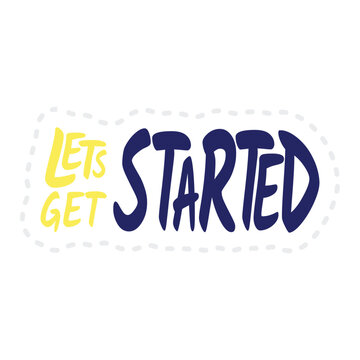

**Importing the relevant libraries**

In [ ]:
import cv2
import PIL
import glob
import time
import scipy
import random
import pathlib
import warnings
import os,shutil
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow import keras
from scipy import ndimage
from sklearn.manifold import TSNE
from tensorflow.keras import layers
from skimage import io, color, feature
from keras.utils import to_categorical
from keras.metrics import Precision, Recall
from tensorflow.keras.regularizers import l2
from sklearn.metrics import confusion_matrix
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from skimage.feature import graycomatrix, graycoprops
from tensorflow.keras.models import Sequential, Model
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, ResNet50
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.utils import array_to_img, img_to_array, load_img
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, LeakyReLU, BatchNormalization, Activation
warnings.filterwarnings("ignore")

In [ ]:
#Creating a directory within Colab environment
!mkdir -p /content/mydrive

In [ ]:
# mounting Google Drive into the directory
from google.colab import drive
drive.mount('/content/mydrive', force_remount=True)


Mounted at /content/mydrive


In [ ]:
# Defining the path for train and test images
train_data_dir = pathlib.Path("/content/mydrive/MyDrive/CNN_PROJECT/data_cnn/Train")
test_data_dir = pathlib.Path("/content/mydrive/MyDrive/CNN_PROJECT/data_cnn/Test")


# **2.0 DATA UNDERSTANDING**
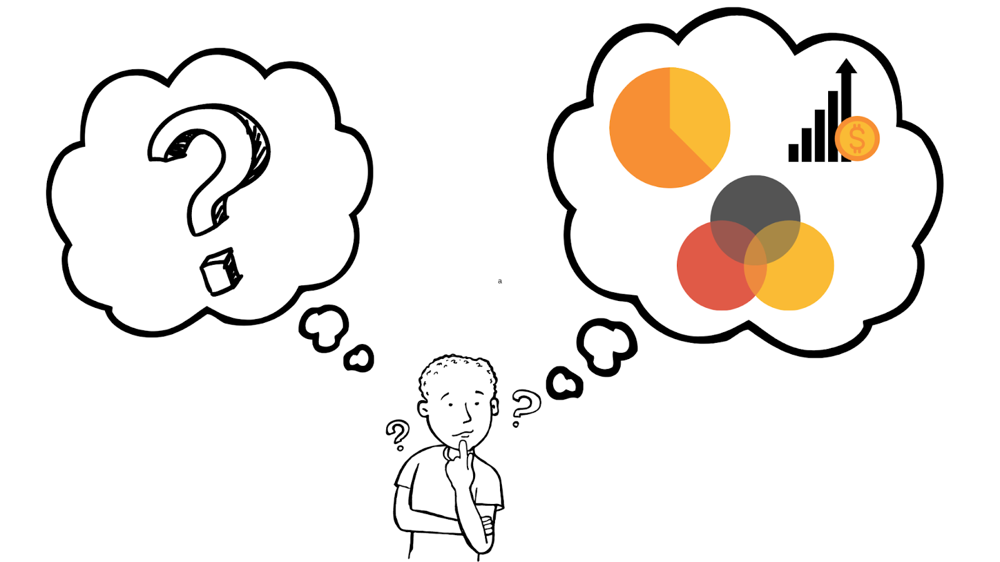


The dataset consists of 2357 images of malignant and benign skin diseases, which were formed from the International Skin Imaging Collaboration (ISIC). All images were sorted according to the classification taken with ISIC, and all subsets were divided into the same number of images, with the exception of melanomas and moles, whose images are slightly dominant.
The data set contains the following 9 skin diseases:

1. **Actinic Keratosis (AK)**: Precancerous skin condition characterized by rough, scaly patches caused by sun exposure.

2. **Basal Cell Carcinoma (BCC**): The most common and usually non-aggressive form of skin cancer, often appearing as a pearly bump on sun-exposed areas.

3. **Dermatofibroma**: Benign skin tumor that presents as a firm, reddish-brown bump on the skin's surface.

4. **Melanoma**: Highly aggressive form of skin cancer originating from melanin-producing cells, often manifesting as irregular, dark moles or new skin lesions.

5. **Nevus (Mole)**: A common and usually harmless skin growth, though changes should be monitored for signs of melanoma.

6. **Pigmented Benign Keratosis**: A non-cancerous growth appearing as raised, scaly lesions of various colors.

7. **Squamous Cell Carcinoma (SCC)**: A skin cancer arising from sun-exposed areas, typically presenting as a red, scaly patch or non-healing sore.

8. **Vascular Lesion**: Abnormal blood vessels on the skin's surface, including conditions like hemangiomas and port-wine stains, usually non-cancerous but may require treatment.

9. **Seborrheic Keratosis**: a common benign skin growth characterized by raised, waxy, and often pigmented lesions that can appear anywhere on the body, typically in older individuals.


## **2.1 Count of Images**

In [ ]:
# Counting Test and Train sets
image_count_train = len(list(train_data_dir.glob('*/*.jpg')))
print("Train images:", image_count_train)
image_count_test = len(list(test_data_dir.glob('*/*.jpg')))
print("Test images:", image_count_test)

Train images: 2239
Test images: 118


In [ ]:
# Counting images from each class
class_names = sorted([dir.name for dir in train_data_dir.glob('*')])

class_names_list = []
train_counts = []
test_counts = []
for class_name in class_names:
    train_class_dir = train_data_dir / class_name
    test_class_dir = test_data_dir / class_name

    train_count = len(list(train_class_dir.glob('*.jpg')))
    test_count = len(list(test_class_dir.glob('*.jpg')))

    class_names_list.append(class_name)
    train_counts.append(train_count)
    test_counts.append(test_count)

# Create a Pandas DataFrame
data = {
    "Class Name": class_names_list,
    "Train Images": train_counts,
    "Test Images": test_counts
}
df = pd.DataFrame(data)
df.reset_index(inplace=True, drop=True)

print(df)

                   Class Name  Train Images  Test Images
0           actinic keratosis           114           16
1        basal cell carcinoma           376           16
2              dermatofibroma            95           16
3                    melanoma           438           16
4                       nevus           357           16
5  pigmented benign keratosis           462           16
6        seborrheic keratosis            77            3
7     squamous cell carcinoma           181           16
8             vascular lesion           139            3


The above 2 cells of code shows as follows:

* Our dataset comprises 2,239 samples for the training set and 118 samples for the test set.
* The count of samples for each of the 9 classes in the training set varies, ranging from 77 to 462.
* In the test set 7 of the classes consist of 16 samples each, while 2 classes have only 3 samples each.


# **3.0 EXPLORATIVE DATA ANALYSIS (EDA)**
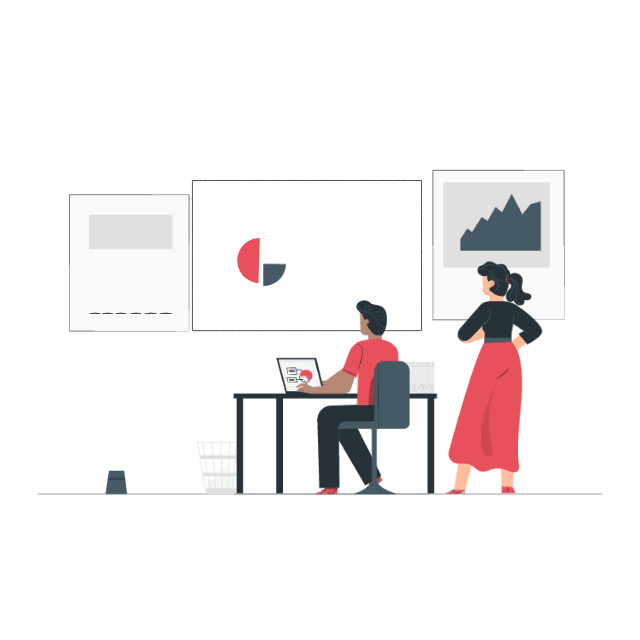

## **3.1 Image counts**

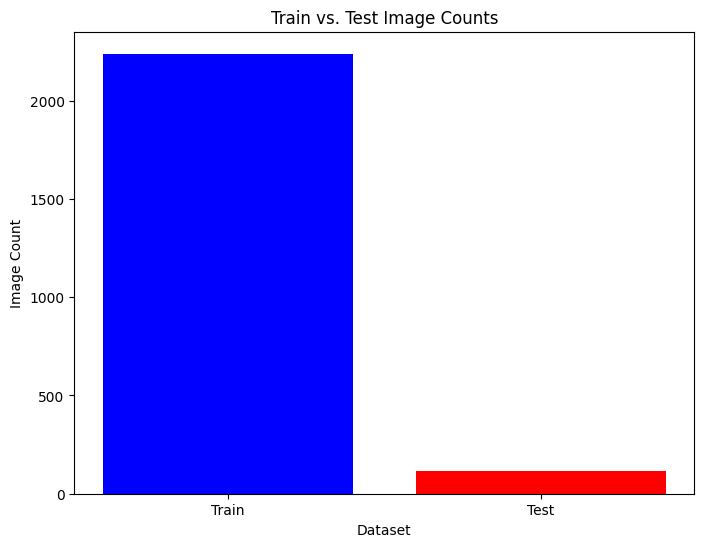

In [ ]:
# Visualization of Train and Test sets
image_count_train = len(list(train_data_dir.glob('*/*.jpg')))
image_count_test = len(list(test_data_dir.glob('*/*.jpg')))

categories = ['Train', 'Test']
counts = [image_count_train, image_count_test]

plt.figure(figsize=(8, 6))
plt.bar(categories, counts, color=['blue', 'red'])
plt.xlabel('Dataset')
plt.ylabel('Image Count')
plt.title('Train vs. Test Image Counts')
plt.show()

The above shows visualization of the distribution of Train and Test sets.
- Distribution of the skin diseases image dataset with  5% of dataset reserved for testing purposes and 95% of dataset for training  the CNN Model

##**3.2 Cancerous and Non-Cancerous images**

In [ ]:
# Creating a new column 'Cancerous' to categorize conditions as cancerous or non-cancerous
df['Cancerous'] = df['Class Name'].apply(lambda x: 'Cancerous' if x in ['melanoma', 'basal cell carcinoma', 'squamous cell carcinoma'] else 'Non-Cancerous')

# Counting the number of cancerous and non-cancerous conditions in the training set
train_cancerous_count = df[df['Cancerous'] == 'Cancerous']['Train Images'].sum()
train_non_cancerous_count = df[df['Cancerous'] == 'Non-Cancerous']['Train Images'].sum()

# Counting the number of cancerous and non-cancerous conditions in the test set
test_cancerous_count = df[df['Cancerous'] == 'Cancerous']['Test Images'].sum()
test_non_cancerous_count = df[df['Cancerous'] == 'Non-Cancerous']['Test Images'].sum()

# Calculating the total counts of cancerous and non-cancerous conditions
total_cancerous_count = train_cancerous_count + test_cancerous_count
total_non_cancerous_count = train_non_cancerous_count + test_non_cancerous_count

print("Cancerous Skin Conditions (Train):", train_cancerous_count)
print("Non-Cancerous Skin Conditions (Train):", train_non_cancerous_count)
print("Cancerous Skin Conditions (Test):", test_cancerous_count)
print("Non-Cancerous Skin Conditions (Test):", test_non_cancerous_count)
print("Total Cancerous Skin Conditions:", total_cancerous_count)
print("Total Non-Cancerous Skin Conditions:", total_non_cancerous_count)

Cancerous Skin Conditions (Train): 995
Non-Cancerous Skin Conditions (Train): 1244
Cancerous Skin Conditions (Test): 48
Non-Cancerous Skin Conditions (Test): 70
Total Cancerous Skin Conditions: 1043
Total Non-Cancerous Skin Conditions: 1314


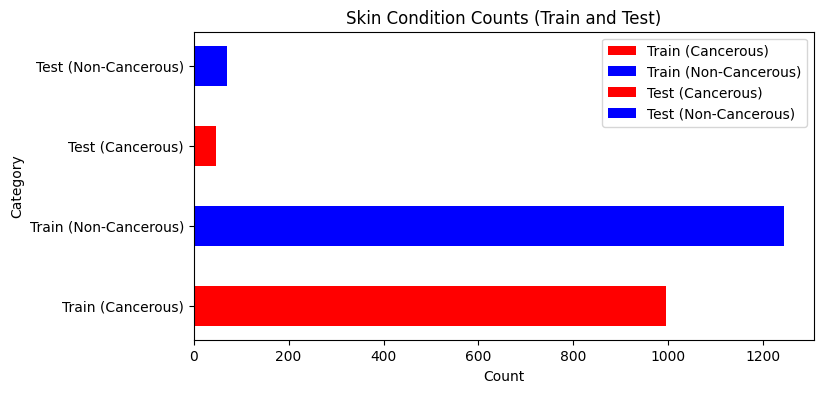

In [ ]:
categories = ['Train (Cancerous)', 'Train (Non-Cancerous)', 'Test (Cancerous)', 'Test (Non-Cancerous)']
counts = [train_cancerous_count, train_non_cancerous_count, test_cancerous_count, test_non_cancerous_count]

# Calculating total counts
total_cancerous_count = train_cancerous_count + test_cancerous_count
total_non_cancerous_count = train_non_cancerous_count + test_non_cancerous_count
total_counts = [total_cancerous_count, total_non_cancerous_count, total_cancerous_count, total_non_cancerous_count]

# Stacked horizontal bar chart
plt.figure(figsize=(8, 4))
bottom = [0, 0, 0, 0]
colors = ['red', 'blue', 'red', 'blue']
bar_width = 0.5

for i in range(len(categories)):
    plt.barh(categories[i], counts[i], height=bar_width, left=bottom[i], color=colors[i], label=categories[i])
    bottom[i] += counts[i]

plt.title('Skin Condition Counts (Train and Test)')
plt.ylabel('Category')
plt.xlabel('Count')
plt.legend()
plt.show()

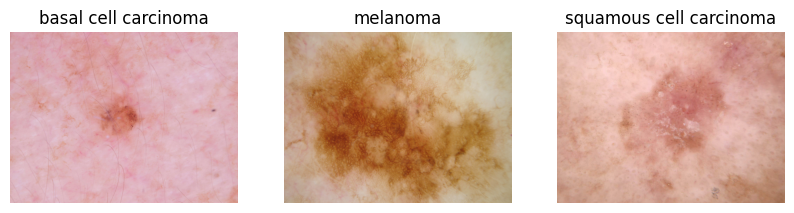

In [ ]:
# Random dispay of cancerous images
plt.figure(figsize=(10, 10))
cancerous_indices = [i for i, class_name in enumerate(class_names) if class_name in ['melanoma', 'basal cell carcinoma', 'squamous cell carcinoma']]

for i, idx in enumerate(cancerous_indices):
    plt.subplot(3, 3, i + 1)
    class_dir = random.choice(list(train_data_dir.glob(class_names[idx] + '/*.jpg')))
    image = plt.imread(str(class_dir))
    plt.title(class_names[idx])
    plt.imshow(image)
    plt.axis("off")
plt.show()

From the above visualization we are able to see cancerous skin images with distinct appearances in each random view.

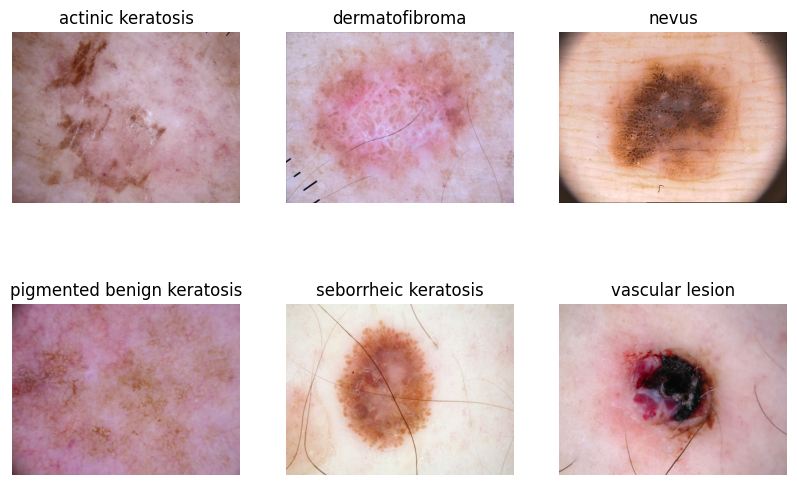

In [ ]:
# Random display of non-cancerous images
plt.figure(figsize=(10, 10))
non_cancerous_indices = [i for i in range(len(class_names)) if i not in cancerous_indices]

for i, idx in enumerate(non_cancerous_indices):
    plt.subplot(3, 3, i + 4)
    class_dir = random.choice(list(train_data_dir.glob(class_names[idx] + '/*.jpg')))
    image = plt.imread(str(class_dir))
    plt.title(class_names[idx])
    plt.imshow(image)
    plt.axis("off")

plt.show()

The above non-cancerous images show distinct patches from pinkish, black, red and purple in colour.

## **3.3 Random sample Images**

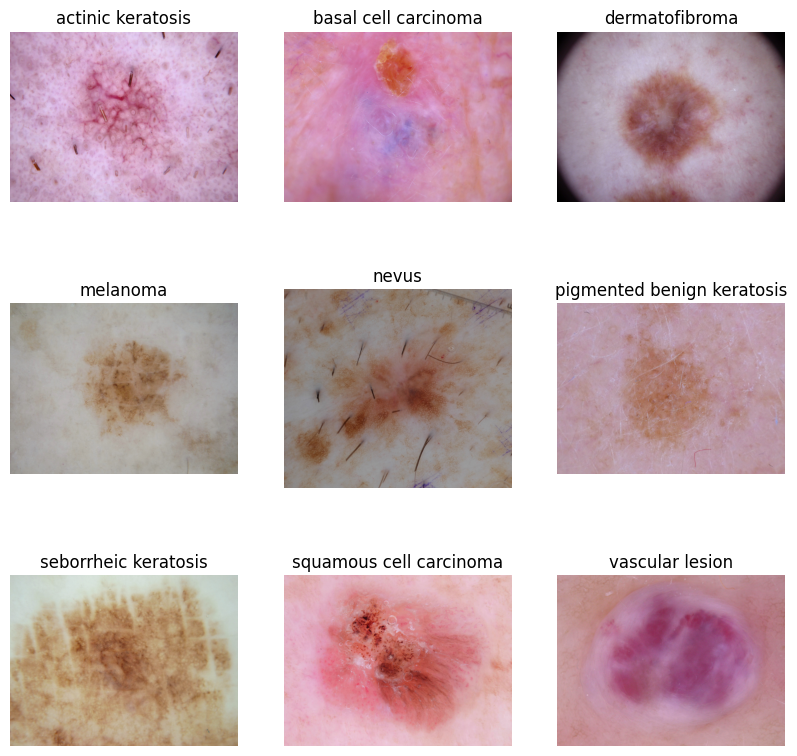

In [ ]:
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    class_dir = random.choice(list(train_data_dir.glob(class_names[i] + '/*.jpg')))
    image = plt.imread(str(class_dir))
    plt.title(class_names[i])
    plt.imshow(image)
    plt.axis("off")
plt.show()

The visualization above shows a sample of image per class:
- The images have distinct  appearance from red, pink, brow, black and purple colors
- Actinic Keratosis appears as a visible rash,  Melanoma appears as a dark patch and Dermatofibroma presents like tiny brownish  patches

## **3.4 Class Distribution**

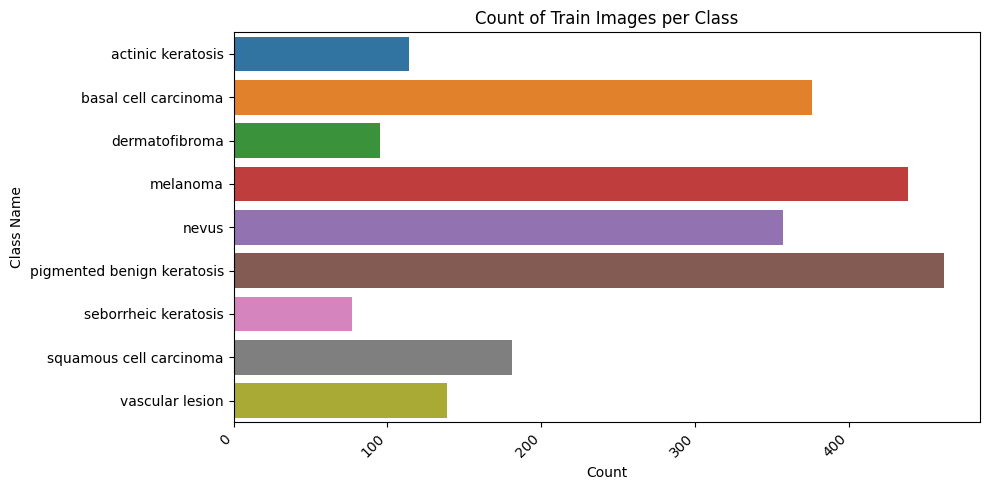

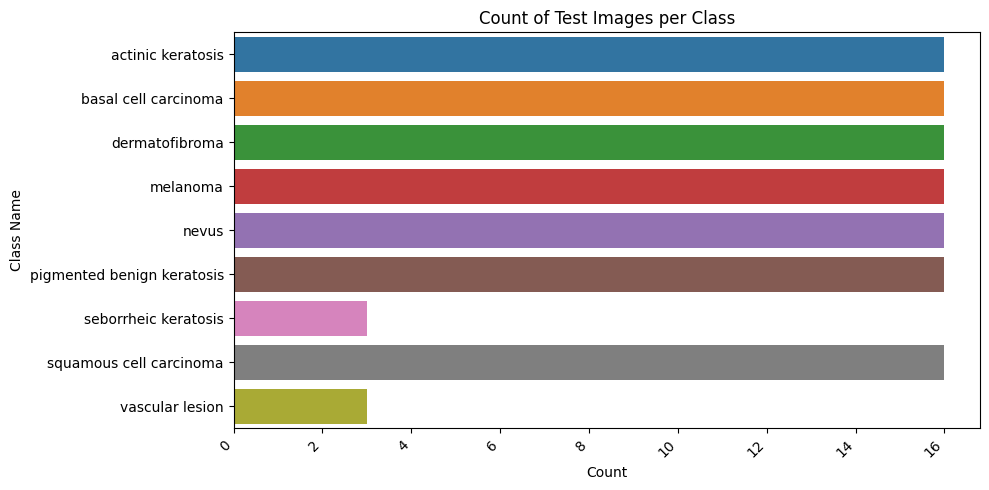

In [ ]:
columns_to_plot = ["Train Images", "Test Images" ]

def plot_bar_chart(column):
    plt.figure(figsize=(10, 5))
    sns.barplot(data=df, y='Class Name', x=column, orient ='h')
    plt.title(f"Count of {column} per Class")
    plt.xlabel("Count")
    plt.ylabel("Class Name")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

for column in columns_to_plot:
    plot_bar_chart(column)


From the bar Graphs above, the following observatiaons can be made:
- The train class is relatively imbalanced compared to the test set.
- There are less instances of particular skin disease types in both train and test which may impact on the model's ability to generalize.

##**3.5 Height and Width Distribution of Images**

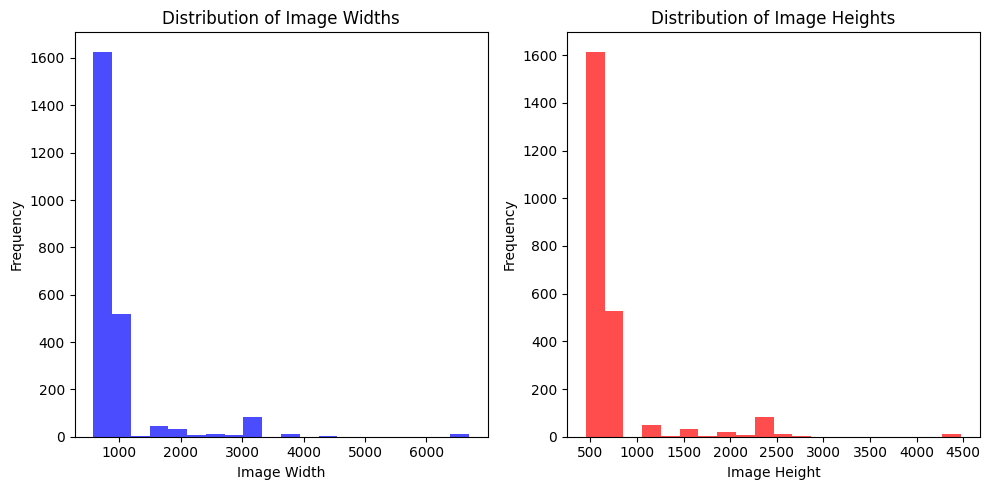

In [ ]:
def create_histogram(data, title, color):
    plt.hist(data, bins=20, color=color, alpha=0.7)
    plt.xlabel(title)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {title}s')

# Defining subdirectories
subdirectories = [train_data_dir, test_data_dir]

image_widths = []
image_heights = []

for subset_dir in subdirectories:
    subset_name = os.path.basename(subset_dir)
    classes = os.listdir(subset_dir)

    for class_name in classes:
        class_dir = os.path.join(subset_dir, class_name)
        sample_images = os.listdir(class_dir)

        for image_name in sample_images:
            image_path = os.path.join(class_dir, image_name)
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            height, width = img.shape[:2]
            image_widths.append(width)
            image_heights.append(height)

# Creating histograms for image widths and heights
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
create_histogram(image_widths, 'Image Width', 'blue')

plt.subplot(1, 2, 2)
create_histogram(image_heights, 'Image Height', 'red')
plt.tight_layout()
plt.show()

##**3.6 Density Distribution ( Height Vs Width)**

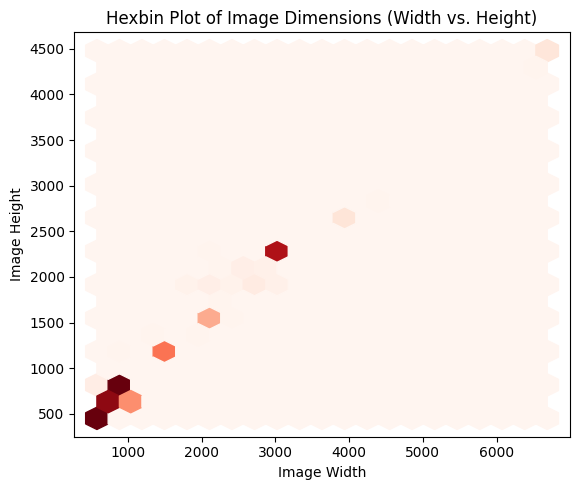

In [ ]:
plt.figure(figsize=(11, 5))
plt.subplot(1, 2, 1)
plt.hexbin(x=image_widths, y=image_heights, gridsize=20, cmap='Reds', vmin=0, vmax=100)
plt.xlabel('Image Width')
plt.ylabel('Image Height')
plt.title('Hexbin Plot of Image Dimensions (Width vs. Height)')
plt.tight_layout()
plt.show()

Visualization of the weights and heights of the images show that;
- Most of the images have widths ranging from 450 to 1100
- Most images have heights ranging from 450 -800
- The density plot reveals that most of the images are approximately sized as 500 *450
- There is an outlier circled in red with dimensions approximately aroung 6500 pixels in width and 4500 pixels in height.

We shall standardize the image dimensions by resizing them to a common size

## **3.7 Class Separation**

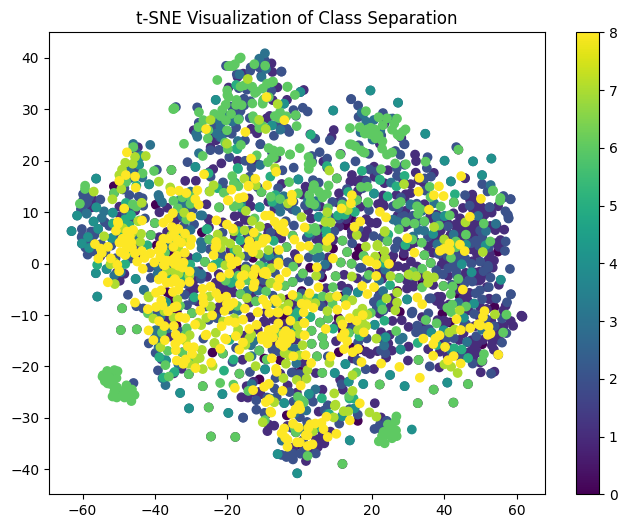

In [ ]:
# Defining the classes in the data directory
classes = os.listdir(train_data_dir)

feature_vectors = []
class_labels = []

def extract_features(image):
    resized_image = cv2.resize(image, (64, 64))
    feature_vector = resized_image.flatten()
    return feature_vector

for i, class_name in enumerate(classes):
    class_dir = os.path.join(train_data_dir, class_name)
    sample_images = os.listdir(class_dir)

    for image_name in sample_images:
        image_path = os.path.join(class_dir, image_name)
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        feature_vector = extract_features(img)

        feature_vectors.append(feature_vector)
        class_labels.append(i)

# Standardizing the features vectors (mean=0, std=1)
scaler = StandardScaler()
feature_vectors = scaler.fit_transform(feature_vectors)

# Applying t-SNE to reduce dimensionality to 2D
tsne = TSNE(n_components=2, random_state=42)
embedded_features = tsne.fit_transform(feature_vectors)

# Creating a scatter plot to visualize class separation
plt.figure(figsize=(8, 6))
plt.scatter(embedded_features[:, 0], embedded_features[:, 1], c=class_labels, cmap='viridis')
plt.title("t-SNE Visualization of Class Separation")
plt.colorbar()
plt.show()


From the tSNE visualization on class separation, the classes are spread all over and there are no clear cut separation of classes.

- t-SNE showing no clear class separation implies:
  - Complex or similar visual characteristics in the data.
  - Potential challenges for image classification.
- We shall use advanced techniques  to enhance accuracy in classification of the images into the nine cancer types. These include:
  - Deep learning,
  - CNN, and
  - ensemble methods
- We shall also use appropriate metrics considering class imbalance.


## **3.8 Texture Analysis**

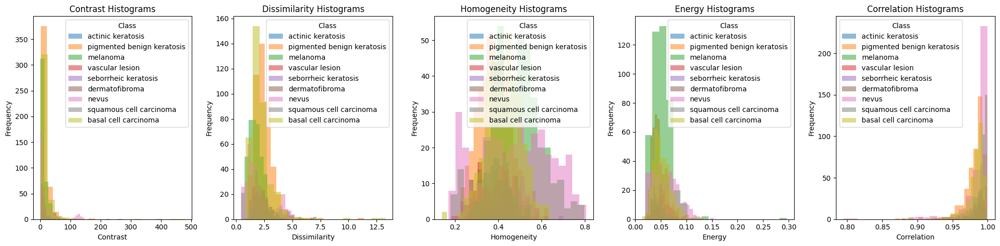

In [ ]:
# List of class folders containing images
class_folders = os.listdir(train_data_dir)

# GLCM properties to calculate
properties = ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation']

# Creating an empty dictionary to store histograms for each property
property_histograms = {prop: [] for prop in properties}

# Calculating GLCM Features for Each Image in Each Class:
for folder in class_folders:
    class_path = os.path.join(train_data_dir, folder)
    image_files = os.listdir(class_path)

    for image_file in image_files:
        image_path = os.path.join(class_path, image_file)
        image = io.imread(image_path)
        gray_image = color.rgb2gray(image)
        gray_image = (gray_image * 255).astype(np.uint8)
        glcm = graycomatrix(gray_image, [1], [0], symmetric=True, normed=True)
        features = [feature.graycoprops(glcm, prop)[0, 0] for prop in properties]

        for prop, feature_value in zip(properties, features):
            property_histograms[prop].append((folder, feature_value))

# Creating subplots for each property
num_properties = len(properties)
fig, axes = plt.subplots(1, num_properties, figsize=(20, 5))
for i, prop in enumerate(properties):
    ax = axes[i]
    ax.set_xlabel(prop.capitalize())
    ax.set_ylabel('Frequency')
    ax.set_title(f'{prop.capitalize()} Histograms')

    # Plotting histograms for each class
    for folder in class_folders:
        subset = [value for label, value in property_histograms[prop] if label == folder]
        ax.hist(subset, bins=20, alpha=0.5, label=folder)

    ax.legend(title='Class')


plt.tight_layout()

plt.show()

We can draw the following key insights from our texture analysis:

- Majority of the images have low contrast of below 100.
- Most classes exhibit a near normal distribution in their homogeneity or similarity. This means that there is less diversity among images in the classes.
- Most classes have their images having low energy. This means that there is less variability in pixel intensity of the images.


## **3.9 RGB Visualization**

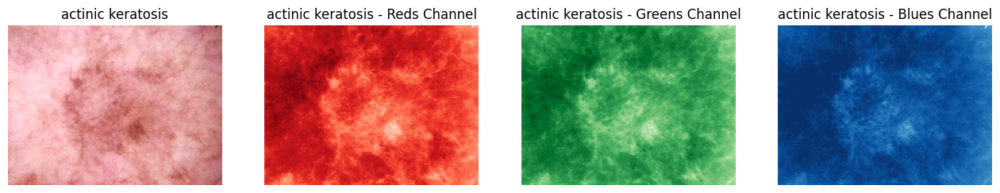

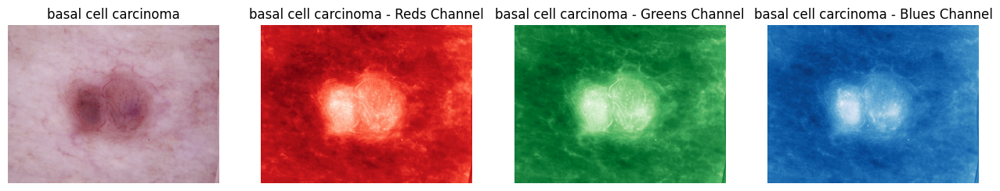

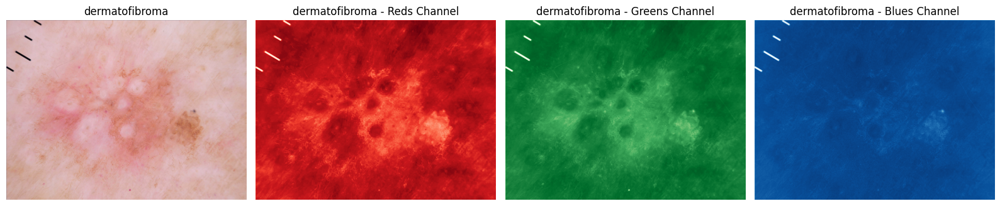

In [ ]:
# Number of random images to display
num_images_to_display = 4

# Create a function to plot color channels
def plot_color_channels(image, class_name):
    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Split the image into color channels
    blue_channel, green_channel, red_channel = cv2.split(image)

    # Create subplots for displaying color channels
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    axes[0].imshow(image)
    axes[0].set_title(class_name)
    axes[0].axis("off")
    for i, (channel, cmap_name) in enumerate(zip([red_channel, green_channel, blue_channel], ['Reds', 'Greens', 'Blues'])):
        axes[i+1].imshow(channel, cmap=cmap_name)
        axes[i+1].set_title(f"{class_name} - {cmap_name.split('_')[0].capitalize()} Channel")
        axes[i+1].axis("off")

# Loop to display random images with color channels for three different classes
for i in range(3):  # Iterate over three different class indices
    # Get a list of image files in the class directory
    class_dir = list(train_data_dir.glob(class_names[i] + '/*.jpg'))

    if not class_dir:
        # Handle the case where there are no images in the directory
        print(f"No images found in the {class_names[i]} directory.")
    else:
        # Choose a random image from the list
        random_image = random.choice(class_dir)
        image = cv2.imread(str(random_image))

        # Call the function to plot color channels
        plot_color_channels(image, class_names[i])

plt.tight_layout()
plt.show()

The RGB visualization above shows class images as they appears in red, blue and green color channels. The images seem to be clearer on the red color channel.

## **3.10 Pixel Intensity**

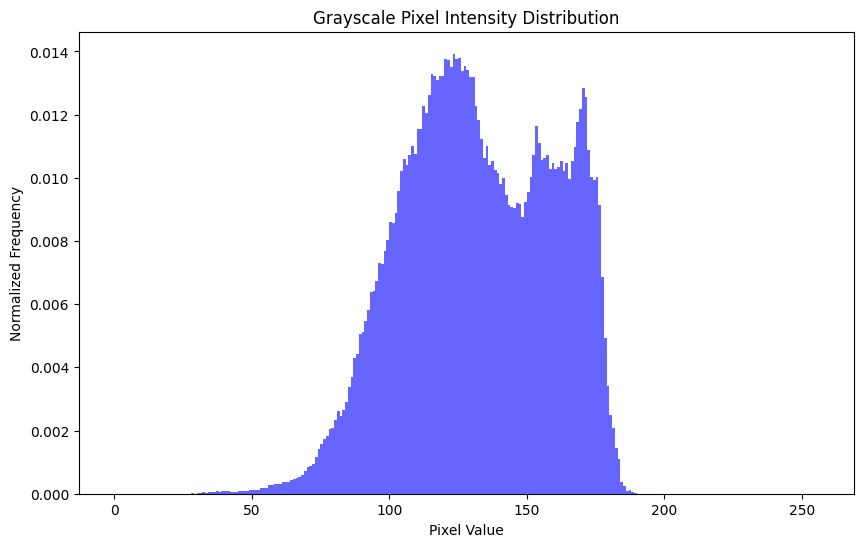

In [ ]:
base_directory = '/content/mydrive/MyDrive/CNN_PROJECT/data_cnn/Train'
# Creating a pattern to match image files (e.g., all files ending with '.jpg')
image_pattern = '*.jpg'

# list of class subdirectories
class_directories = glob.glob(base_directory + '*/')


for class_dir in class_directories:
    class_name = os.path.basename(os.path.normpath(class_dir))
    image_paths = glob.glob(class_dir + image_pattern)

    for image_path in image_paths:
        # Loading an image using OpenCV
        image = cv2.imread(image_path)

       # Converting the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Computing histogram of grayscale pixel intensities
hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

plt.figure(figsize=(10, 6))
plt.hist(gray_image.ravel(), bins=256, range=(0, 256), density=True, color='b', alpha=0.6)
plt.title('Grayscale Pixel Intensity Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Normalized Frequency')
plt.show()



Based on the grayscale pixel intensity distribution above:
* The peak is at pixel value of 130 indicating that this value is the most common or frequent pixel value in the grayscale image.
* The highest normalized frequency value of approximately 0.013 represents the probability of encountering a pixel with the value 130 in the image. In other words, about 1.3% of the pixels in the image have a value of 130.

* The pixel values ranging from around 30 to 190 represent the full range of grayscale pixel values present in the images indicating that the images have a wide range of pixel values, covering both darker and brighter regions.

# **4.0 DATA PREPROCESSING**
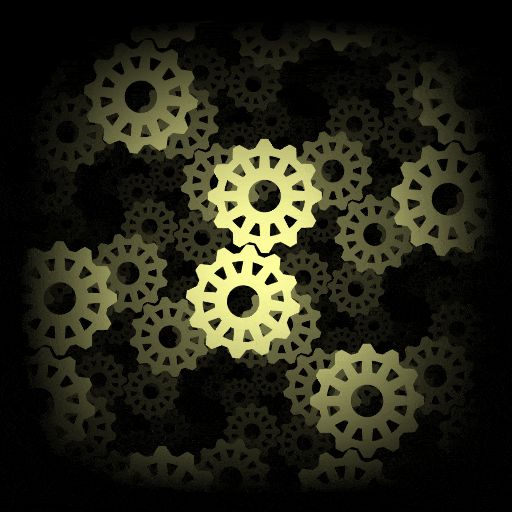

In the upcoming code cells, we will perform the following preprocessing steps on our image dataset:

* Create a new directory named 'split_cnn' to organize images that have been split from the original Train set into Training and Validation sets, while keeping the original Train set intact.

* Verify the counts of the split datasets and ensure the integrity of the original test set.

* Normalize our images by rescaling pixel values to ensure uniformity, and resize them to meet specific size requirements for optimal model performance.

* Address class imbalance issues, where some classes may have significantly more instances than others, to avoid bias towards classes with a higher number of images.

## **4.1 Splitting Data**

In [ ]:
# Defining the destination directories for the training and validation sets
training_data_dir = pathlib.Path("/content/mydrive/MyDrive/CNN_PROJECT/split_cnn/Training_set")
validation_data_dir = pathlib.Path("/content/mydrive/MyDrive/CNN_PROJECT/split_cnn/Validation_set")

# Creating the destination directories
training_data_dir.mkdir(parents=True, exist_ok=True)
validation_data_dir.mkdir(parents=True, exist_ok=True)

class_dirs = [dir.name for dir in test_data_dir.glob('*')]

# Splitting the data into training and validation sets while maintaining the original directory structure
for class_dir in class_dirs:
    class_images = list((train_data_dir / class_dir).glob('*.jpg'))
    train_images, val_images = train_test_split(class_images, test_size=0.4, random_state=123)
    (training_data_dir / class_dir).mkdir(parents=True, exist_ok=True)
    (validation_data_dir / class_dir).mkdir(parents=True, exist_ok=True)

    # Copying the images to their respective directories
    for train_image in train_images:
        shutil.copy(train_image, training_data_dir / class_dir / train_image.name)

    for val_image in val_images:
        shutil.copy(val_image, validation_data_dir / class_dir / val_image.name)

print("Data splitting complete.")

Data splitting complete.


We have opted to use a 60:40 split to ensure that we strike a balance between having enough data for training and having a sufficiently large validation set to assess model performance effectively. Given that we already have a separate test set, further dividing the training data into training and validation subsets allows us to evaluate model performance effectively without overly diminishing the size of the training dataset.

## **4.2 Count of image after split**

In [ ]:
#Total Count for created Training_set, Validation_set and Original Test
image_count_training = len(list(training_data_dir.glob('*/*.jpg')))
print("Training images:", image_count_training)
image_count_validation = len(list(validation_data_dir.glob('*/*.jpg')))
print("Validation images:", image_count_validation)
image_count_test = len(list(test_data_dir.glob('*/*.jpg')))
print("Test images:", image_count_test)

Training images: 1340
Validation images: 899
Test images: 118


## **4.3 Rescaling and Resizing**

In [ ]:
# transforming data in the directory split/train (1574 images)
batch_size =32
class_mode = 'categorical'
train_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(
        training_data_dir,
        target_size=(64, 64), batch_size = batch_size, class_mode = class_mode)

# transforming  data in the directory split/validation (677 images)
val_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(
        validation_data_dir,
        target_size=(64, 64), batch_size = batch_size, class_mode = class_mode)

# tranforming the data in the directory test (118 images)
test_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(
        test_data_dir,
        target_size=(64, 64), batch_size=batch_size, class_mode = class_mode)

Found 1340 images belonging to 9 classes.
Found 899 images belonging to 9 classes.
Found 118 images belonging to 9 classes.


The above code loads and preprocess the image datasets in a memory-efficient manner, especially when dealing with large datasets. The generators yield batches of data and labels that can be fed directly into the model during training, validation, or testing.

## **4.4 Checking for class imbalance**




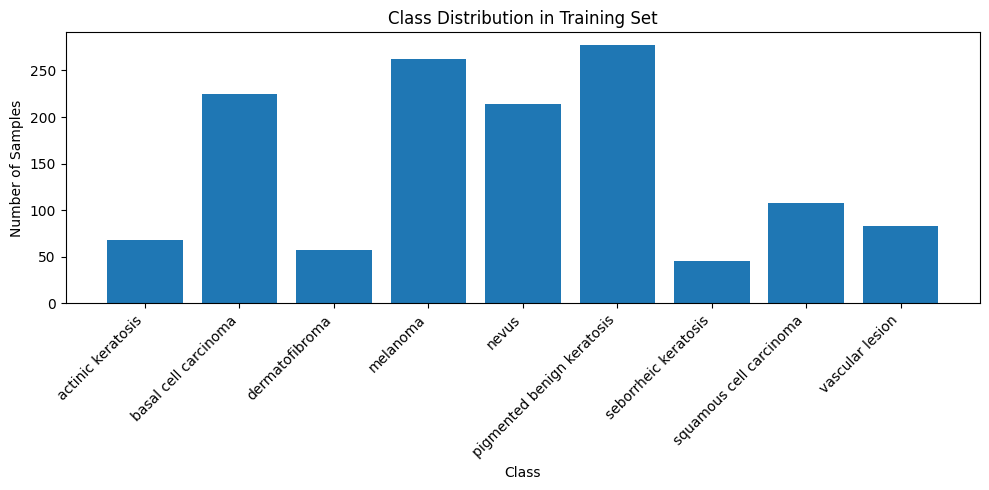

In [ ]:
# class labels and counts for the training set
class_labels = train_generator.class_indices
class_counts = train_generator.classes

# Calculating the number of samples in each class
unique_classes, class_counts = np.unique(class_counts, return_counts=True)

# Mapping class labels to class names
class_names = {v: k for k, v in class_labels.items()}

plt.figure(figsize=(10, 5))
plt.bar(class_names.values(), class_counts)
plt.title('Class Distribution in Training Set')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for readability
plt.tight_layout()
plt.show()

The visualization above illustrates the class distribution, highlighting significant imbalances among the classes. Specifically, certain classes, such as sebarrheic keratosis, dermatofibroma, and actinic keratosis, exhibit considerably smaller sample sizes. In contrast, classes like melanoma, pigmented benign keratosis, and basal cell carcinoma are characterized by larger sample sizes. We shall use the augmenter to deal with imbalance in the second model.

# **5.0 MODELING**
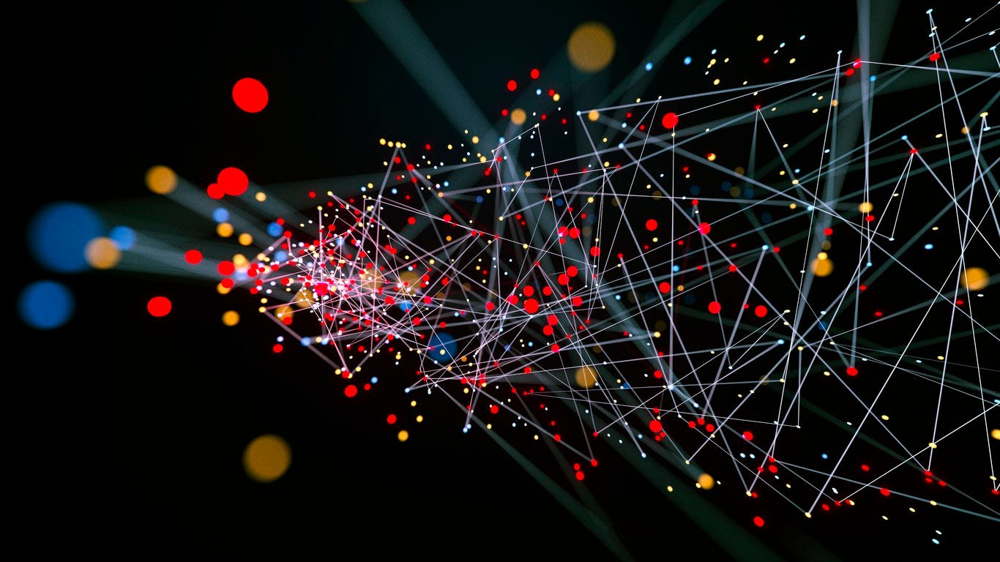

## **5.1 Baseline Model**

In [ ]:
# creating a function for model 1 and 2
def create_and_train_model(model_number, train_generator, val_generator):
    # Creating the model layers
    early_stopping = EarlyStopping(monitor='val_loss',
                                   patience=10,
                                   restore_best_weights=True)

    np.random.seed(123)
    model = Sequential()
    model.add(layers.Conv2D(16, (3, 3), activation='relu', padding='same',
                            input_shape=(64, 64, 3)))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(32, (4, 4), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(9, activation='softmax'))

    model.compile(loss='categorical_crossentropy',
                  optimizer="adam",  # You can adjust the learning rate if needed
                  metrics=[keras.metrics.Precision(name='precision'), keras.metrics.Recall(name='recall'), keras.metrics.Accuracy(name='accuracy')])

    # Training the model and storing the history
    history = model.fit(train_generator,
                        epochs=100,
                        validation_data=val_generator,
                        callbacks=[early_stopping])

    return model, history

In [ ]:
# To create and train model1 and get its history, you can call the function like this:
model7, history7 = create_and_train_model(7, train_generator, val_generator)

Epoch 1/100
42/42 [==============================] - 52s 1s/step - loss: 2.0450 - precision: 0.0000e+00 - recall: 0.0000e+00 - accuracy: 0.0000e+00 - val_loss: 1.9729 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_accuracy: 0.0000e+00
Epoch 2/100
42/42 [==============================] - 44s 1s/step - loss: 1.8345 - precision: 0.5798 - recall: 0.0515 - accuracy: 0.0000e+00 - val_loss: 1.8205 - val_precision: 0.6364 - val_recall: 0.0156 - val_accuracy: 0.0000e+00
Epoch 3/100
42/42 [==============================] - 35s 836ms/step - loss: 1.6925 - precision: 0.5976 - recall: 0.1097 - accuracy: 0.0000e+00 - val_loss: 1.6488 - val_precision: 0.6196 - val_recall: 0.1123 - val_accuracy: 0.0000e+00
Epoch 4/100
42/42 [==============================] - 44s 1s/step - loss: 1.5773 - precision: 0.6687 - recall: 0.1657 - accuracy: 0.0000e+00 - val_loss: 1.7904 - val_precision: 0.4792 - val_recall: 0.0768 - val_accuracy: 0.0000e+00
Epoch 5/100
42/42 [==============================] - 36s 

In [ ]:
# creating a function for model 1 and 2
def create_and_train_model(model_number, train_generator, val_generator):
    # Creating the model layers
    early_stopping = EarlyStopping(monitor='val_loss',
                                   patience=10,
                                   restore_best_weights=True)

    np.random.seed(123)
    model = Sequential()
    model.add(layers.Conv2D(16, (3, 3), activation='relu', padding='same',
                            input_shape=(64, 64, 3)))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(32, (4, 4), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(9, activation='softmax'))

    model.compile(loss='categorical_crossentropy',
                  optimizer="adam",  # You can adjust the learning rate if needed
                  metrics=['accuracy', Precision(), Recall()])

    # Training the model and storing the history
    history = model.fit(train_generator,
                        epochs=100,
                        validation_data=val_generator,
                        callbacks=[early_stopping])

    return model, history

In [ ]:
# To create and train model1 and get its history, you can call the function like this:
model1, history1 = create_and_train_model(1, train_generator, val_generator)

Epoch 1/100
42/42 [==============================] - 42s 717ms/step - loss: 2.0210 - accuracy: 0.2373 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 1.9243 - val_accuracy: 0.2747 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/100
42/42 [==============================] - 24s 587ms/step - loss: 1.7752 - accuracy: 0.3619 - precision: 0.6410 - recall: 0.0746 - val_loss: 1.6679 - val_accuracy: 0.4260 - val_precision: 0.6199 - val_recall: 0.1524
Epoch 3/100
42/42 [==============================] - 24s 560ms/step - loss: 1.6217 - accuracy: 0.4299 - precision: 0.6483 - recall: 0.1582 - val_loss: 1.5777 - val_accuracy: 0.4416 - val_precision: 0.6250 - val_recall: 0.1446
Epoch 4/100
42/42 [==============================] - 24s 586ms/step - loss: 1.5156 - accuracy: 0.4694 - precision: 0.6964 - recall: 0.1866 - val_loss: 1.5078 - val_accuracy: 0.4861 - val_precision: 0.6336 - val_recall: 0.1846
Epoch 5/100
42/42 [==============================] - 24s 584ms/step - loss: 1.49

In [ ]:
# Saving the entire baseline model including architecture and weights
model1.save("model1.h5")

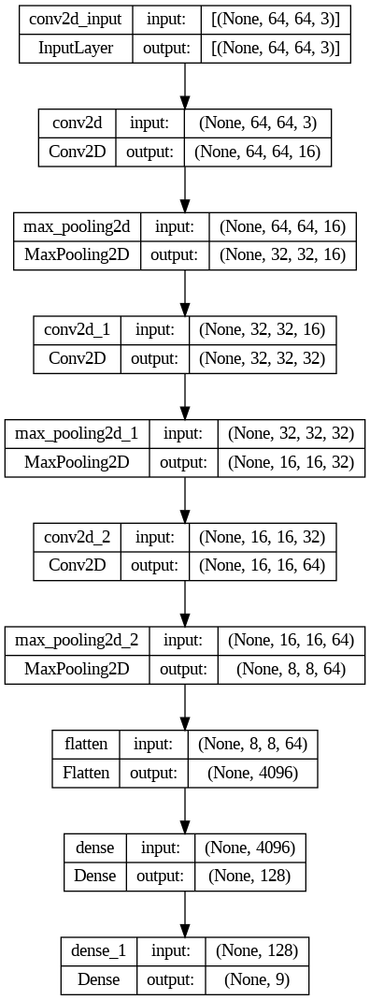

In [ ]:
from tensorflow.keras.models import load_model

# Load the saved baseline model
baseline_model = load_model("model1.h5")

# Visualize the loaded baseline model
from tensorflow.keras.utils import plot_model

# Plot the baseline model architecture
plot_model(baseline_model, to_file='baseline_model.png', show_shapes=True)

In [ ]:
# Let us have a close look at precision of the above model
precision = model1.evaluate(train_generator, verbose=1)[2]
precision_v = model1.evaluate(val_generator, verbose=1)[2]
print("Precision: ", precision)
print("Validation Precision: ", precision_v)

29/29 [==============================] - 9s 293ms/step - loss: 1.3475 - accuracy: 0.5317 - precision: 0.6839 - recall: 0.3393
Precision:  0.7526595592498779
Validation Precision:  0.6838564872741699


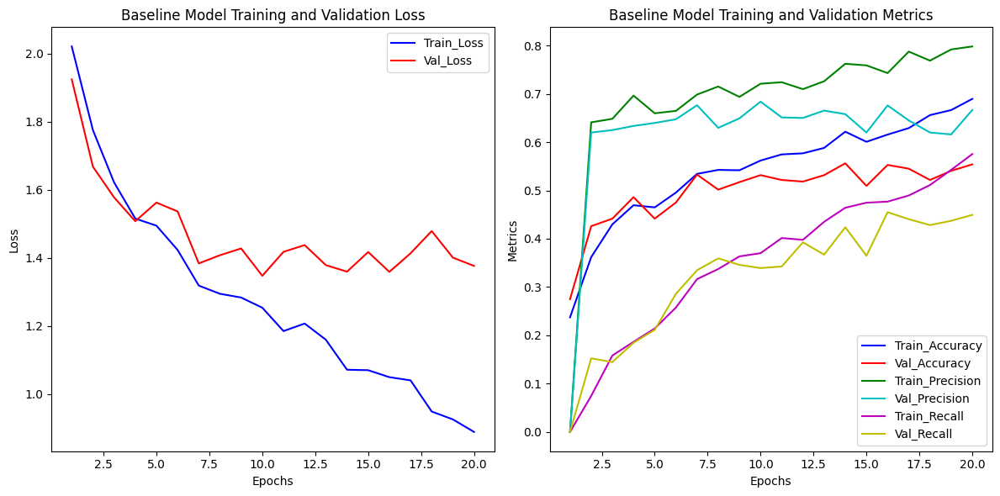

In [ ]:
# Accessing training history from the 'history' object
training_loss = history1.history['loss']
validation_loss = history1.history['val_loss']
training_accuracy = history1.history['accuracy']
validation_accuracy = history1.history['val_accuracy']
training_precision = history1.history['precision']
validation_precision = history1.history['val_precision']
training_recall = history1.history['recall']
validation_recall = history1.history['val_recall']

# Number of epochs
epochs = range(1, len(training_loss) + 1)

# creating a plot
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(epochs, training_loss, 'b-', label='Train_Loss')
plt.plot(epochs, validation_loss, 'r-', label='Val_Loss')
plt.title('Baseline Model Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Metrics
plt.subplot(122)
plt.plot(epochs, training_accuracy, 'b-', label='Train_Accuracy')
plt.plot(epochs, validation_accuracy, 'r-', label='Val_Accuracy')
plt.plot(epochs, training_precision, 'g-', label='Train_Precision')
plt.plot(epochs, validation_precision, 'c-', label='Val_Precision')
plt.plot(epochs, training_recall, 'm-', label='Train_Recall')
plt.plot(epochs, validation_recall, 'y-', label='Val_Recall')
plt.title('Baseline Model Training and Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()


plt.tight_layout()
plt.show()


We can see that our Baseline model seems to be overfitting on Accuracy, Precision and Recall Metrics.

* For instance the value of 0.7527 on training Precision means that our model correctly predicted the positive class with a precision of approximately 75.27% while the value of 0.6839 on the validation Precision means that our model correctly predicted the positive class with a precision of approximately 68.39%.
* Our training loss is 1.1437 and validation loss is 1.3475, meaning that the training loss outperforms the validation loss, a sign of overfitting. The lower the losses the better it is for our model to generalize well to new, unseen data.

We shall go ahead and augment our dataset to deal with overfitting and class imbalance


##**5.2 Models with Data Augmentation**



### **5.2.1 Model 2: Using only Augmented data**

---



In [ ]:
pip install Augmentor

In [ ]:
import Augmentor
np.random.seed(123)

# Defining a function to create an Augmentor pipeline
def create_augmentor_pipeline(input_dir, output_dir, num_samples):
    p = Augmentor.Pipeline(input_dir, output_dir)
    p.rotate(probability=0.7, max_left_rotation=25, max_right_rotation=25)
    p.zoom_random(probability=0.5, percentage_area=0.8)
    p.random_contrast(probability=0.5, min_factor=0.7, max_factor=1.3)
    p.random_brightness(probability=0.5, min_factor=0.7, max_factor=1.3)
    p.random_color(probability=0.5, min_factor=0.5, max_factor=2.0)
    p.random_distortion(probability=0.5, grid_width=4, grid_height=4, magnitude=8)
    p.flip_left_right(probability=0.5)
    p.random_erasing(probability=0.2, rectangle_area=0.2)
    p.sample(4000)

# Define the directories for your augmented data
input_dir = '/content/mydrive/MyDrive/CNN_PROJECT/split_cnn/Training_set'
output_dir = '/content/mydrive/MyDrive/CNN_PROJECT/split_cnn/Augmented_set1'

# Create an Augmentor pipeline and generate augmented data
create_augmentor_pipeline(input_dir, output_dir, num_samples=4000)

Initialised with 1340 image(s) found.
Output directory set to /content/mydrive/MyDrive/CNN_PROJECT/split_cnn/Augmented_set1.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7ECD459D1E70>: 100%|██████████| 4000/4000 [10:52<00:00,  6.13 Samples/s]


In [ ]:
output_dir = '/content/mydrive/MyDrive/CNN_PROJECT/split_cnn/Augmented_set1'
# Now, create data generators for training and validation
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Load augmented data from the output directory
train_generator2 = train_datagen.flow_from_directory(
    output_dir,
    target_size=(64, 64),
    batch_size=32,
    class_mode='categorical'
)

Found 4000 images belonging to 9 classes.


In [ ]:
# To create and train model2 and get its history, you can call the function like this:
model2, history2 = create_and_train_model(2, train_generator2, val_generator)

Epoch 1/100
125/125 [==============================] - 1310s 10s/step - loss: 1.8375 - accuracy: 0.3290 - precision_1: 0.5325 - recall_1: 0.0553 - val_loss: 1.6535 - val_accuracy: 0.3960 - val_precision_1: 0.5286 - val_recall_1: 0.0412
Epoch 2/100
125/125 [==============================] - 35s 284ms/step - loss: 1.6158 - accuracy: 0.4033 - precision_1: 0.6175 - recall_1: 0.1392 - val_loss: 1.4977 - val_accuracy: 0.4850 - val_precision_1: 0.6978 - val_recall_1: 0.1413
Epoch 3/100
125/125 [==============================] - 37s 294ms/step - loss: 1.5307 - accuracy: 0.4478 - precision_1: 0.6365 - recall_1: 0.1900 - val_loss: 1.3972 - val_accuracy: 0.5083 - val_precision_1: 0.6906 - val_recall_1: 0.2358
Epoch 4/100
125/125 [==============================] - 34s 276ms/step - loss: 1.4657 - accuracy: 0.4708 - precision_1: 0.6451 - recall_1: 0.2368 - val_loss: 1.5470 - val_accuracy: 0.4538 - val_precision_1: 0.6545 - val_recall_1: 0.1390
Epoch 5/100
125/125 [==============================] - 3

In [ ]:
# Saving the entire model2 including architecture and weights
model2.save("model2.h5")

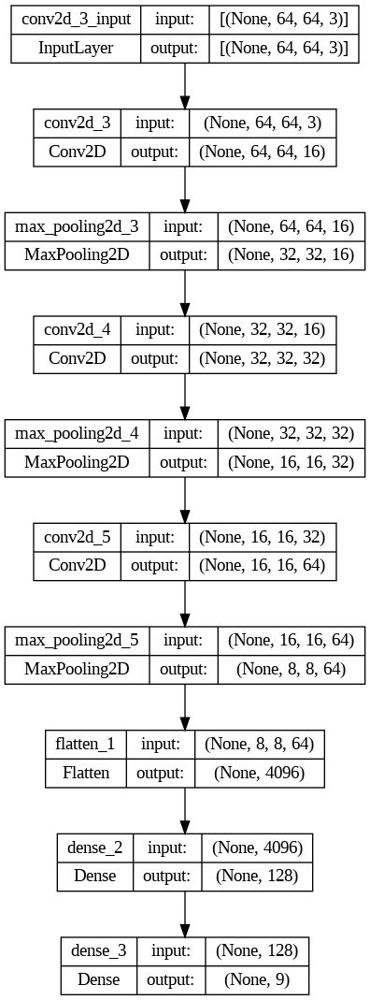

In [ ]:
from tensorflow.keras.models import load_model

# Load the saved second model
second_model = load_model("model2.h5")

# Visualize the loaded second model
from tensorflow.keras.utils import plot_model

# Plot the second model architecture
plot_model(second_model, to_file='second_model.png', show_shapes=True)

In [ ]:
# Let us have a close look at precision of the above model
precision = model2.evaluate(train_generator2, verbose=1)[2]
precision_v = model2.evaluate(val_generator, verbose=1)[2]
print("Precision: ", precision)
print("Validation Precision: ", precision_v)

29/29 [==============================] - 10s 333ms/step - loss: 1.2334 - accuracy: 0.5640 - precision_1: 0.6741 - recall_1: 0.4349
Precision:  0.7067082524299622
Validation Precision:  0.6741379499435425


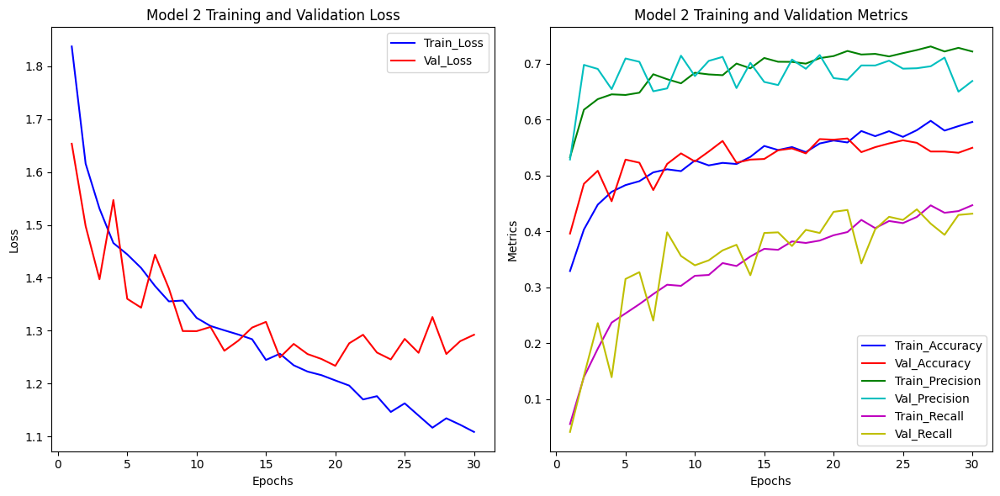

In [ ]:
# Accessing training history from the 'history' object
training_loss = history2.history['loss']
validation_loss = history2.history['val_loss']
training_accuracy = history2.history['accuracy']
validation_accuracy = history2.history['val_accuracy']
training_precision = history2.history['precision_1']
validation_precision = history2.history['val_precision_1']
training_recall = history2.history['recall_1']
validation_recall = history2.history['val_recall_1']

# Number of epochs
epochs = range(1, len(training_loss) + 1)

# creating a plot
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(epochs, training_loss, 'b-', label='Train_Loss')
plt.plot(epochs, validation_loss, 'r-', label='Val_Loss')
plt.title('Model 2 Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Metrics
plt.subplot(122)
plt.plot(epochs, training_accuracy, 'b-', label='Train_Accuracy')
plt.plot(epochs, validation_accuracy, 'r-', label='Val_Accuracy')
plt.plot(epochs, training_precision, 'g-', label='Train_Precision')
plt.plot(epochs, validation_precision, 'c-', label='Val_Precision')
plt.plot(epochs, training_recall, 'm-', label='Train_Recall')
plt.plot(epochs, validation_recall, 'y-', label='Val_Recall')
plt.title('Model 2 Training and Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()


plt.tight_layout()
plt.show()


After dealing with class imbalance and augmentation using the augmenter it appears from the metrics that overfitting has reduced to some extent:

* While data augmentation has likely helped in reducing overfitting, it may not completely eliminate it. The training loss (1.1367) is lower than the validation loss (1.2334), which aligns with the idea that the model fits the training data better.
* For instance the training precision (0.7067) 70.67% is higher than the validation precision (0.6741) 67.41%. This suggests that there might still be some overfitting, as the model is performing better on the training data than on unseen validation data.

Due to the limited size of our dataset and the observed issue of overfitting in our models we have decided to use a pre-trained model known as VGG16 to enhance the overall performance of our models and address the challenges posed by the small dataset.

### **5.2.2: Model 3 - Using Pre-trained Model(VGG16)**
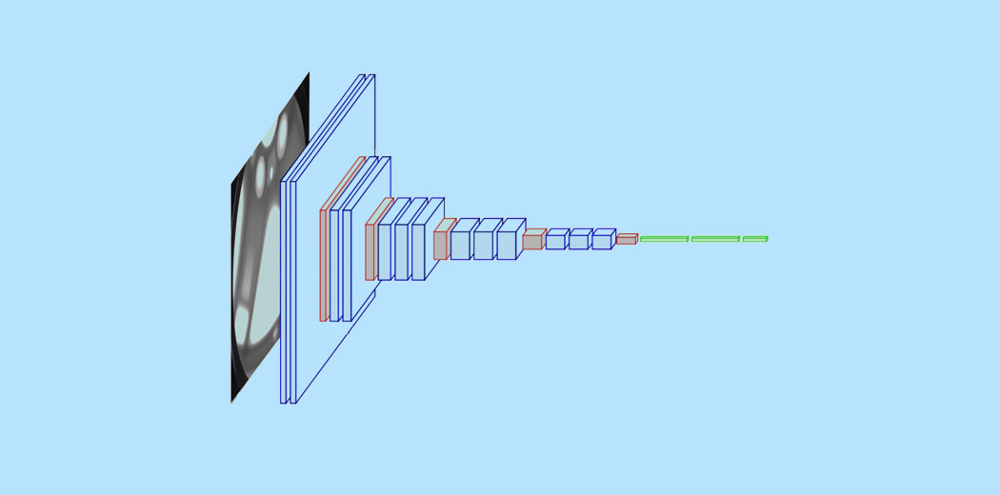

VGG16 is a machine learning model that has been trained on a large dataset before being applied to a specific task or problem. It is known for its simplicity and effectiveness in image classification tasks.

In [ ]:
# Set the hyperparameters
dense_units = 128
epochs = 100
filters = 64
kernel_size = (3, 3)

# Set random seed for reproducibility
np.random.seed(123)

# Create the model
model3 = Sequential()

# Add a base model (VGG16 in this example)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
model3.add(base_model)
model3.add(GlobalAveragePooling2D())

# Add Dense layers
model3.add(Dense(256, activation='relu'))
model3.add(Dense(128, activation='relu'))
model3.add(Dense(64, activation='relu'))

# Output layer
model3.add(Dense(9, activation='softmax'))

# Compile the model with the specified learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model3.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy', Precision(), Recall()])

# Print a summary of the model
model3.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_4 (Dense)             (None, 256)               131328    
                                                                 
 dense_5 (Dense)             (None, 128)               32896     
                                                                 
 dense_6 (Dense)             (None, 64)                8256      
                                                                 
 dense_7 (Dense)             (None, 9)                 

In [ ]:
# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model
history3 = model3.fit(
  train_generator2,
  validation_data=val_generator,
  epochs=100,
  callbacks=[early_stopping]
)

Epoch 1/100
125/125 [==============================] - 51s 329ms/step - loss: 1.7811 - accuracy: 0.3350 - precision_2: 0.6280 - recall_2: 0.0920 - val_loss: 1.3783 - val_accuracy: 0.4816 - val_precision_2: 0.6834 - val_recall_2: 0.2425
Epoch 2/100
125/125 [==============================] - 40s 319ms/step - loss: 1.4023 - accuracy: 0.5123 - precision_2: 0.6565 - recall_2: 0.2795 - val_loss: 1.3690 - val_accuracy: 0.5217 - val_precision_2: 0.7702 - val_recall_2: 0.2759
Epoch 3/100
125/125 [==============================] - 37s 298ms/step - loss: 1.2913 - accuracy: 0.5437 - precision_2: 0.6998 - recall_2: 0.3770 - val_loss: 1.2793 - val_accuracy: 0.5684 - val_precision_2: 0.6986 - val_recall_2: 0.4538
Epoch 4/100
125/125 [==============================] - 39s 308ms/step - loss: 1.1822 - accuracy: 0.5875 - precision_2: 0.7264 - recall_2: 0.4380 - val_loss: 1.2243 - val_accuracy: 0.5862 - val_precision_2: 0.7332 - val_recall_2: 0.3760
Epoch 5/100
125/125 [==============================] - 3

In [ ]:
# # Saving the entire model3 including architecture and weights
# model3.save("model3.h5")

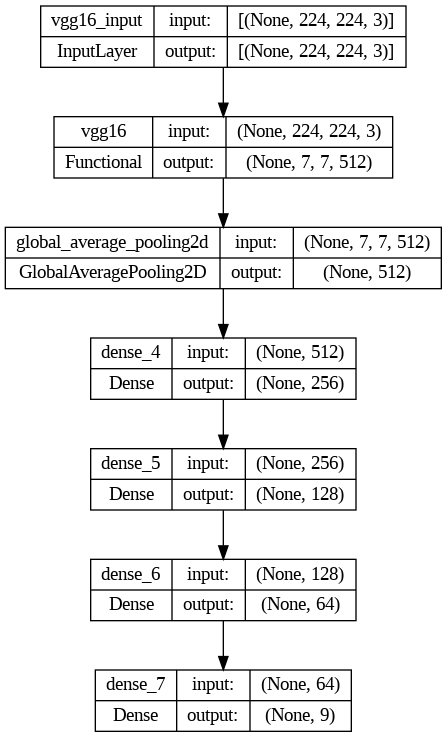

In [ ]:
from tensorflow.keras.models import load_model

# Load the saved third model
third_model = load_model("model3.h5")

# Visualize the loaded the third model
from tensorflow.keras.utils import plot_model

# Plot the third model architecture
plot_model(third_model, to_file='third_model.png', show_shapes=True)

In [ ]:
# Let us have a close look at precision of the above model
precision = model3.evaluate(train_generator2, verbose=1)[2]
precision_v = model3.evaluate(val_generator, verbose=1)[2]
print("Precision: ", precision)
print("Validation Precision: ", precision_v)

29/29 [==============================] - 10s 327ms/step - loss: 1.0313 - accuracy: 0.6485 - precision_2: 0.7316 - recall_2: 0.5640
Precision:  0.8148148059844971
Validation Precision:  0.7316017150878906


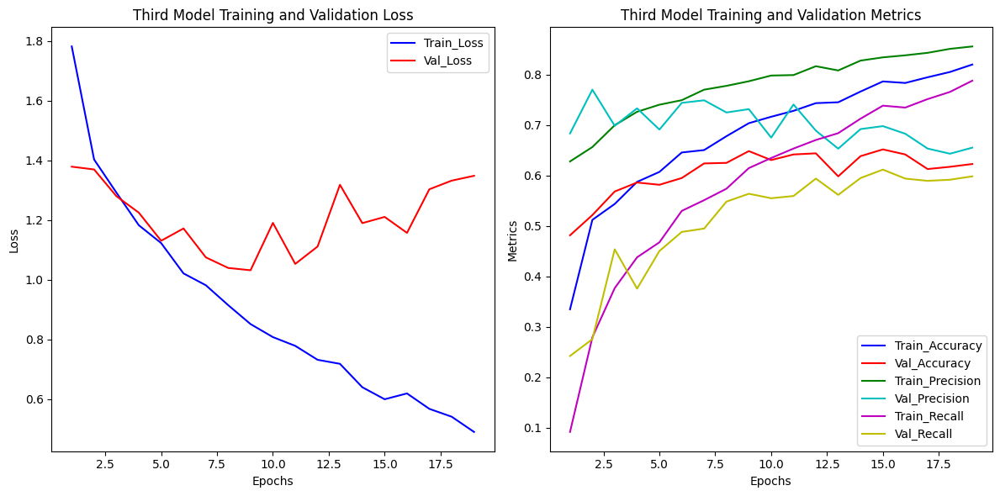

In [ ]:
# Accessing training history from the 'history' object
training_loss = history3.history['loss']
validation_loss = history3.history['val_loss']
training_accuracy = history3.history['accuracy']
validation_accuracy = history3.history['val_accuracy']
training_precision = history3.history['precision_2']
validation_precision = history3.history['val_precision_2']
training_recall = history3.history['recall_2']
validation_recall = history3.history['val_recall_2']

# Number of epochs
epochs = range(1, len(training_loss) + 1)

# creating a plot
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(epochs, training_loss, 'b-', label='Train_Loss')
plt.plot(epochs, validation_loss, 'r-', label='Val_Loss')
plt.title('Third Model Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Metrics
plt.subplot(122)
plt.plot(epochs, training_accuracy, 'b-', label='Train_Accuracy')
plt.plot(epochs, validation_accuracy, 'r-', label='Val_Accuracy')
plt.plot(epochs, training_precision, 'g-', label='Train_Precision')
plt.plot(epochs, validation_precision, 'c-', label='Val_Precision')
plt.plot(epochs, training_recall, 'm-', label='Train_Recall')
plt.plot(epochs, validation_recall, 'y-', label='Val_Recall')
plt.title('Third Model Training and Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()


plt.tight_layout()
plt.show()


After introducing a pre-trained model it appears that our metrics and loss performance are improving:

* While introducing VVG16 has likely helped in reducing overfitting and increasing the metrics, it has not completely eliminated it. The training loss (0.7620) is lower than the validation loss (1.0313), which is an improvement from our second model
* The training precision (0.8148) 81.48% is higher than the validation precision (0.7316) 73.16%. This suggests that there might still be some overfitting, as the model is performing better on the training data than on unseen validation data. The metrics are however higher than the second model.

We shall implement dropout to prevent overfitting  and to enhance the overall performance of our model.

In [ ]:
from tensorflow.keras.models import load_model

# Load the saved model
third_model = load_model("/content/mydrive/MyDrive/CNN_PROJECT/Third_model/model3.h5")

1/1 [==============================] - 0s 28ms/step


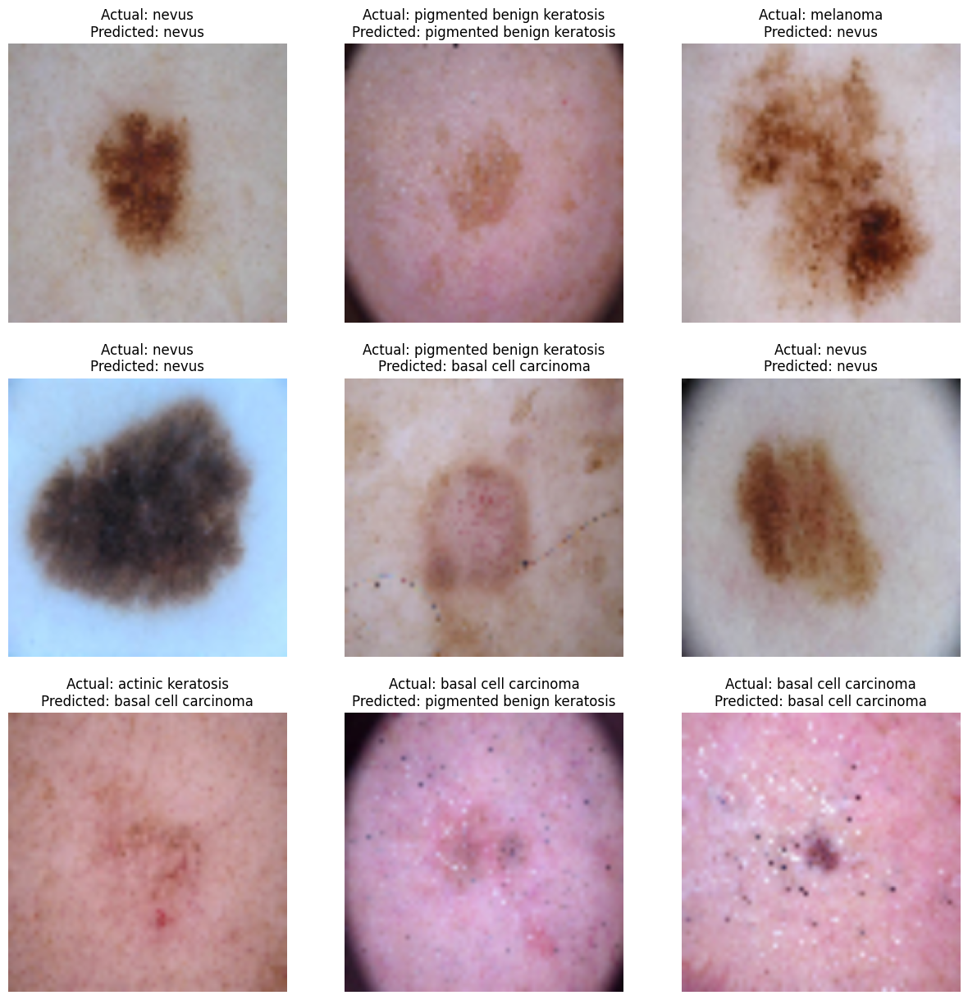

In [ ]:
# Define the number of rows and columns for the grid
num_rows = 3
num_cols = 3

# Create an iterator from the test generator to access the test images and their labels
test_iterator = iter(test_generator)

# Create a figure with subplots for displaying the images in a grid
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Define class names
class_names = [
    "actinic keratosis",
    "basal cell carcinoma",
    "dermatofibroma",
    "melanoma",
    "nevus",
    "pigmented benign keratosis",
    "seborrheic keratosis",
    "squamous cell carcinoma",
    "vascular lesion"
]

# Loop through the grid and display images with actual and predicted class labels
for row in range(num_rows):
    for col in range(num_cols):
        # Get a batch of images and labels from the test generator
        images, labels = next(test_iterator)

        # Select the first image from the batch
        sample_image = images[0]

        # Resize the image to the target shape (assuming your model expects 224x224 images)
        sample_image = tf.image.resize(sample_image, (224, 224))

        # Make a prediction using your loaded model
        predictions = third_model.predict(sample_image.numpy().reshape(1, 224, 224, 3))

        # Get the predicted class name
        predicted_class = class_names[np.argmax(predictions)]

        # Get the actual class name
        actual_class = class_names[np.argmax(labels[0])]

        # Display the image with the actual and predicted class names
        axes[row, col].imshow(sample_image.numpy())
        axes[row, col].set_title(f"Actual: {actual_class}\nPredicted: {predicted_class}")
        axes[row, col].axis('off')

plt.show()

1/1 [==============================] - 0s 467ms/step
Image 1: Precision = 1.00


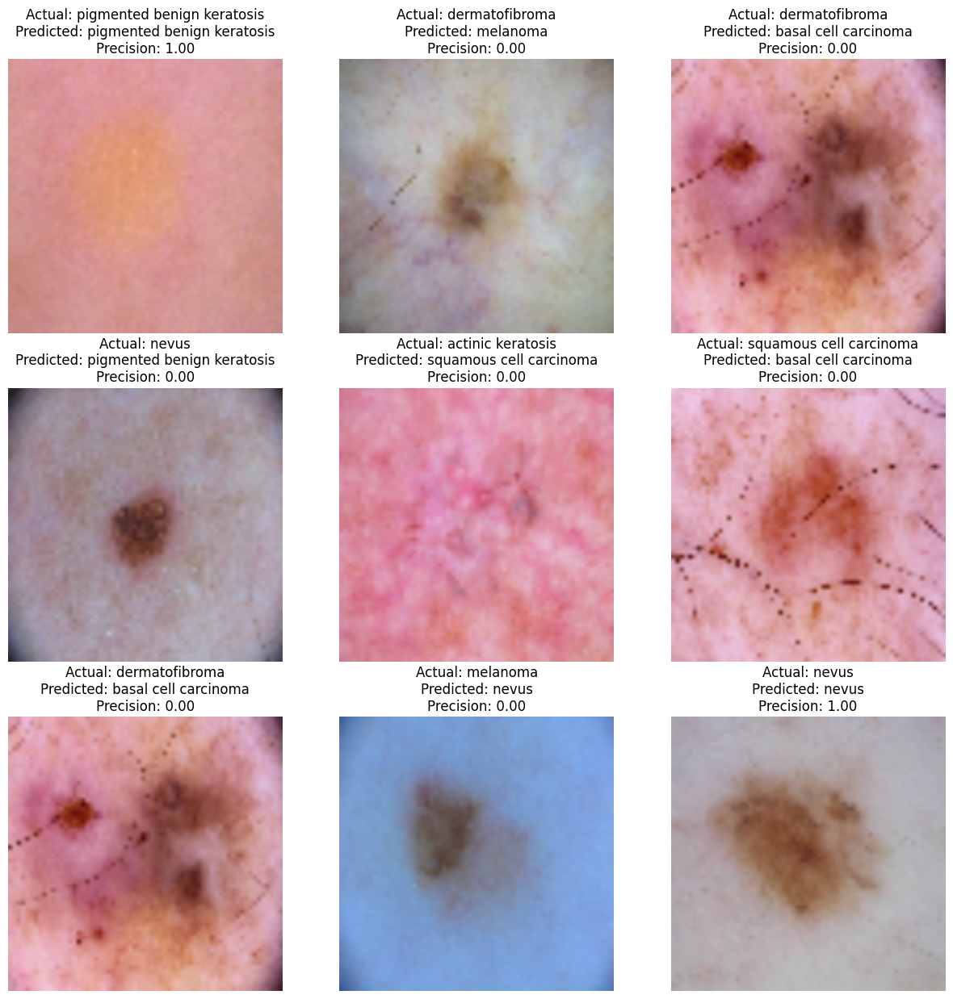

Image 9: Precision = 1.00


In [ ]:
# Define the number of rows and columns for the grid
num_rows = 3
num_cols = 3

# Create an iterator from the test generator to access the test images and their labels
test_iterator = iter(test_generator)

# Create a figure with subplots for displaying the images in a grid
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Define class names
class_names = [
    "actinic keratosis",
    "basal cell carcinoma",
    "dermatofibroma",
    "melanoma",
    "nevus",
    "pigmented benign keratosis",
    "seborrheic keratosis",
    "squamous cell carcinoma",
    "vascular lesion"
]

# Lists to store actual and predicted labels for precision calculation
actual_labels = []
predicted_labels = []
precision_scores = []

# Set a threshold for precision score
precision_threshold = 0.7

# Loop through the grid and display images with actual and predicted class labels
for row in range(num_rows):
    for col in range(num_cols):
        # Get a batch of images and labels from the test generator
        images, labels = next(test_iterator)

        # Select the first image from the batch
        sample_image = images[0]

        # Resize the image to the target shape (assuming your model expects 224x224 images)
        sample_image = tf.image.resize(sample_image, (224, 224))

        # Make a prediction using your loaded model
        predictions = third_model.predict(sample_image.numpy().reshape(1, 224, 224, 3))

        # Get the predicted class name
        predicted_class = class_names[np.argmax(predictions)]

        # Get the actual class name
        actual_class = class_names[np.argmax(labels[0])]

        # Store actual and predicted labels for precision calculation
        actual_labels.append(actual_class)
        predicted_labels.append(predicted_class)

        # Calculate precision
        precision = precision_score([actual_class], [predicted_class], average='macro')
        precision_scores.append(precision)

        # Display the image with the actual and predicted class names
        axes[row, col].imshow(sample_image.numpy())
        axes[row, col].set_title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nPrecision: {precision:.2f}")
        axes[row, col].axis('off')

# Show images with precision scores above the threshold
for i, precision in enumerate(precision_scores):
    if precision > precision_threshold:
        print(f"Image {i + 1}: Precision = {precision:.2f}")
        plt.show()

plt.show()

The model appears to correctly predict Nevus better than any other conditions, more images need to be provided for the other classes on the training set to improve the model.

### **5.2.3: Model 4 - Using Tuned(Dropout) Pre-trained Model(VGG16)**

In [ ]:
# Set the hyperparameters
dense_units = 128
epochs = 100
filters = 64
kernel_size = (3, 3)
learning_rate = 0.0001

# Set random seed for reproducibility
np.random.seed(123)

# Create the model
model4 = Sequential()

# Add a base model (VGG16 in this example)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
model4.add(base_model)
model4.add(GlobalAveragePooling2D())

# Add Dropout layers
model4.add(Dropout(0.5))

# Add Dense layers
model4.add(Dense(256, activation='relu'))
model4.add(Dense(128, activation='relu'))
model4.add(Dense(64, activation='relu'))

# Output layer
model4.add(Dense(9, activation='softmax'))

# Compile the model with the specified learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
model4.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy', Precision(), Recall()])

# Print a summary of the model
model4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_1  (None, 512)               0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_8 (Dense)             (None, 256)               131328    
                                                                 
 dense_9 (Dense)             (None, 128)               32896     
                                                                 
 dense_10 (Dense)            (None, 64)                8256      
                                                      

In [ ]:
# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model
history4 = model4.fit(
  train_generator2,
  validation_data=val_generator,
  epochs=100,
  callbacks=[early_stopping]
)

Epoch 1/100
125/125 [==============================] - 43s 300ms/step - loss: 2.0672 - accuracy: 0.2048 - precision_3: 0.6098 - recall_3: 0.0063 - val_loss: 1.8992 - val_accuracy: 0.3426 - val_precision_3: 0.5052 - val_recall_3: 0.0545
Epoch 2/100
125/125 [==============================] - 38s 302ms/step - loss: 1.8412 - accuracy: 0.3083 - precision_3: 0.5255 - recall_3: 0.0593 - val_loss: 1.7989 - val_accuracy: 0.3181 - val_precision_3: 0.5000 - val_recall_3: 0.0011
Epoch 3/100
125/125 [==============================] - 36s 291ms/step - loss: 1.7219 - accuracy: 0.3530 - precision_3: 0.6080 - recall_3: 0.0985 - val_loss: 1.6836 - val_accuracy: 0.3604 - val_precision_3: 0.6628 - val_recall_3: 0.1268
Epoch 4/100
125/125 [==============================] - 36s 290ms/step - loss: 1.6586 - accuracy: 0.3820 - precision_3: 0.6617 - recall_3: 0.1437 - val_loss: 1.5232 - val_accuracy: 0.4249 - val_precision_3: 0.7227 - val_recall_3: 0.2058
Epoch 5/100
125/125 [==============================] - 3

In [ ]:
# Saving the entire model4 including architecture and weights
model4.save("model4.h5")

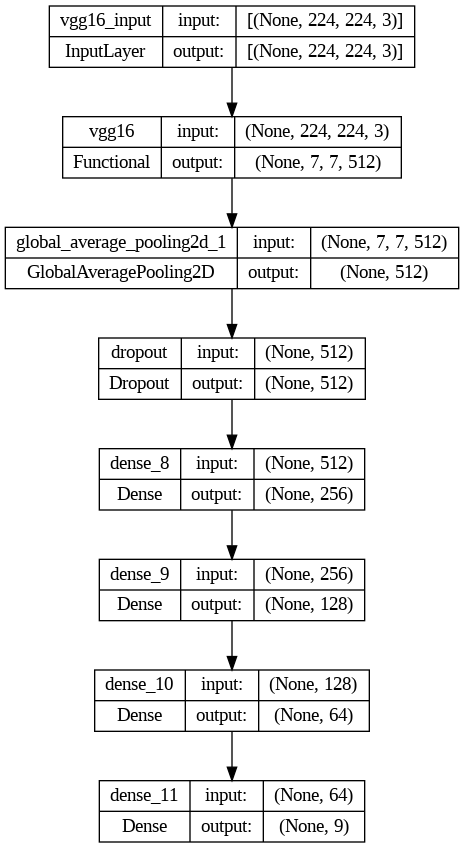

In [ ]:
from tensorflow.keras.models import load_model

# Load the saved fourth model
fourth_model = load_model("model4.h5")

# Visualize the loaded the fourth model
from tensorflow.keras.utils import plot_model

# Plot the fourth model architecture
plot_model(fourth_model, to_file='fourth_model.png', show_shapes=True)

In [ ]:
# Let us have a close look at precision of the above model
precision = model4.evaluate(train_generator2, verbose=1)[2]
precision_v = model4.evaluate(val_generator, verbose=1)[2]
print("Precision: ", precision)
print("Validation Precision: ", precision_v)

29/29 [==============================] - 10s 325ms/step - loss: 1.1275 - accuracy: 0.6374 - precision_3: 0.7092 - recall_3: 0.5940
Precision:  0.8342589735984802
Validation Precision:  0.7091633677482605


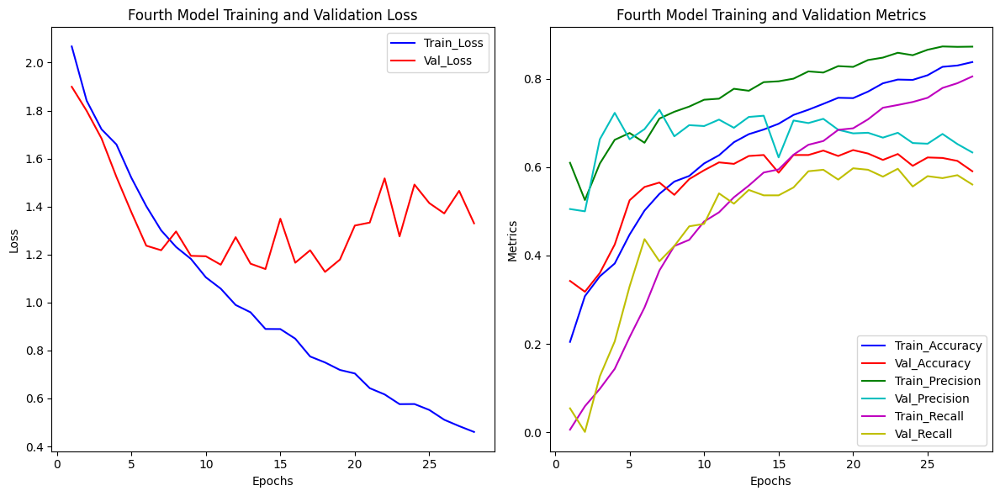

In [ ]:
# Accessing training history from the 'history' object
training_loss = history4.history['loss']
validation_loss = history4.history['val_loss']
training_accuracy = history4.history['accuracy']
validation_accuracy = history4.history['val_accuracy']
training_precision = history4.history['precision_3']
validation_precision = history4.history['val_precision_3']
training_recall = history4.history['recall_3']
validation_recall = history4.history['val_recall_3']

# Number of epochs
epochs = range(1, len(training_loss) + 1)

# creating a plot
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(epochs, training_loss, 'b-', label='Train_Loss')
plt.plot(epochs, validation_loss, 'r-', label='Val_Loss')
plt.title('Fourth Model Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Metrics
plt.subplot(122)
plt.plot(epochs, training_accuracy, 'b-', label='Train_Accuracy')
plt.plot(epochs, validation_accuracy, 'r-', label='Val_Accuracy')
plt.plot(epochs, training_precision, 'g-', label='Train_Precision')
plt.plot(epochs, validation_precision, 'c-', label='Val_Precision')
plt.plot(epochs, training_recall, 'm-', label='Train_Recall')
plt.plot(epochs, validation_recall, 'y-', label='Val_Recall')
plt.title('Fourth Model Training and Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()


plt.tight_layout()
plt.show()

After introducing dropout regularization technique it appears that our metrics and loss performance are becoming worse than the previous model with increased overfitting:

* There is about 0.475 difference between training loss (0.6525) and the validation loss (1.1275), which is a decrease in performance from our third model which had a difference of about 0.269
* The training precision (0.8343) 83.43% is higher than the validation precision (0.7092) 70.92%. There is still some overfitting, as the model is performing better on the training data than on unseen validation data.

We shall introduce a diverse learning rates to prevent overfitting  and to enhance the overall performance of our model.

# **6.0 CONCLUSIONS AND RECOMMENDATIONS**

## **6.1 Data Limitations**

* The skin disease images size was relatively small and could have significantly impacted the model performance
* The Data may have not been from diverse geographical locations or age groups limiting the model's generalizability.
* The dataset may not account for variations in skin tones and ethnicities, which can impact the model's performance in providing accurate diagnoses across diverse patient populations.

## **6.2 Conclusions**

* Precision of 72% demonstrates the potential of our model in enhancing dermatological diagnostics and ultimately improving patient care.

## **6.3 Recommendations**
To build upon our success and advance the model, we recommend the following:
* Obtain a larger image data for training the model.
* Seek data from multiple sources and geographical regions
* Collect data that spans different time periods and age groups. -